In [1]:
# Libraries
library(Seurat)
library(SeuratHelper)
library(dplyr)
library(stringr)
library(tidyr)
library(ggplot2)
library(readxl)
library(cowplot)

The legacy packages maptools, rgdal, and rgeos, underpinning the sp package,
which was just loaded, were retired in October 2023.
Please refer to R-spatial evolution reports for details, especially
https://r-spatial.org/r/2023/05/15/evolution4.html.
It may be desirable to make the sf package available;
package maintainers should consider adding sf to Suggests:.

Attaching SeuratObject


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union




In [2]:
devtools::load_all("~/projects/SeuratHelper")

ℹ Loading SeuratHelper


In [3]:
# Adjust PATH
wd <- getwd()
subdir <- "/bin"
if (endsWith(wd, subdir)) {
    wd <- str_remove(wd, subdir)
    setwd(wd)
}
getwd()

[1] "/vol/projects/odietric/covid19-bal-atlas-integration"

In [4]:
# Variables
in_file <- "data/BCB/filtered_feature_bc_matrix.h5"
in_aggr_csv <- "data/BCB/aggregation.csv"
in_meta <- "data/BCB/tidy-meta-data.csv"
url_markers <- "https://syncandshare.desy.de/index.php/s/B4PDcHA8Jg8zZBm"
url_markers <- paste0(url_markers, "/download")
in_markers <- "docs/celltype/markers.xlsx"
in_meta_promac <- "docs/celltype/covid-profibrotic-macrophages-meta.csv"
url_overview <- "https://syncandshare.desy.de/index.php/s/CrDgDwHRQNDWYcj"
url_overview <- paste0(url_overview, "/download")
in_overview <- "docs/overview.xlsx"
plot_dir <- "analysis/BCB/"
out_file <- "data/BCB/seurat.Rds"

In [5]:
# Download data
download.file(url_markers, in_markers)
download.file(url_overview, in_overview)

In [6]:
# Read data
aggr_csv <- read.csv(in_aggr_csv)
meta_data <- read.csv(in_meta, row.names = "X")
meta_promac <- read.csv(in_meta_promac)
sheets <- excel_sheets(in_markers)
markers <- list()
for (i in sheets) {
    markers[[i]] <- read_excel(in_markers, i)
}
sheets <- excel_sheets(in_overview)
overview <- list()
for (i in sheets) {
    overview[[i]] <- read_excel(in_overview, i)
}

New names:
• `` -> `...3`
• `` -> `...4`
New names:
• `` -> `...3`
New names:
• `` -> `...4`
• `` -> `...5`
Warning message:
“Coercing boolean to numeric in P25 / R25C16”
New names:
• `` -> `...14`
New names:
• `` -> `...1`
• `` -> `...2`
• `` -> `...3`
• `` -> `...4`
• `` -> `...5`
• `` -> `...6`
• `` -> `...7`
• `` -> `...9`
• `` -> `...10`
• `` -> `...12`
• `` -> `...14`
• `` -> `...15`
• `` -> `...16`
• `` -> `...17`
• `` -> `...18`
• `` -> `...19`
• `` -> `...20`
• `` -> `...22`
• `` -> `...23`
• `` -> `...24`
• `` -> `...25`
• `` -> `...26`
• `` -> `...28`
• `` -> `...29`
• `` -> `...30`
• `` -> `...31`
• `` -> `...32`
• `` -> `...33`
• `` -> `...35`
• `` -> `...36`
• `` -> `...37`
• `` -> `...38`
• `` -> `...39`
• `` -> `...41`
• `` -> `...42`
• `` -> `...43`
• `` -> `...44`
• `` -> `...45`
• `` -> `...46`
• `` -> `...47`
• `` -> `...48`
• `` -> `...49`
• `` -> `...50`
• `` -> `...51`
• `` -> `...53`
• `` -> `...55`
• `` -> `...56`
• `` -> `...57`
• `` -> `...58`
• `` -> `...59`

In [7]:
# Read data
mtx <- Read10X_h5(in_file)

Genome matrix has multiple modalities, returning a list of matrices for this genome



In [8]:
# Separate counts by type
hto <- mtx[['Antibody Capture']]
mtx <- mtx[['Gene Expression']]
rownames(mtx) <- make.unique(rownames(mtx), sep="-")

In [9]:
# Separate viral counts
viral_genes <- tail(rownames(mtx), 5)
index <- which(rownames(mtx) %in% viral_genes)
viral <- mtx[index, ]
index <- which(!rownames(mtx) %in% viral_genes)
mtx <- mtx[index, ]

In [10]:
# Create Seurat object
ds <- CreateSeuratObject(mtx, "BCB")
ds[["HTO"]] <- CreateAssayObject(hto)
ds[["VIRAL"]]  <- CreateAssayObject(viral)
ds

Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”


An object of class Seurat 
36620 features across 342470 samples within 3 assays 
Active assay: RNA (36601 features, 0 variable features)
 2 other assays present: HTO, VIRAL

In [11]:
# Add meta data
index <- str_split(colnames(ds), "-", simplify=TRUE)[, 2]
ds$libname <- factor(aggr_csv[index, ][, 1])

In [12]:
# Add meta data
names(overview)
index <- !is.na(overview$libraries$run)
data <- overview$libraries[index, ]
index <- match(ds$libname, data$libname)
ds@meta.data <- cbind(ds@meta.data, data[index, c("TotalSeq-A", "sample")])

[1] "libraries"                    "patients"                    
[3] "samples"                      "examinations"                
[5] "hto_features"                 "hto_indices"                 
[7] "clinical_meta_data_variables" "Lung Mechanics"

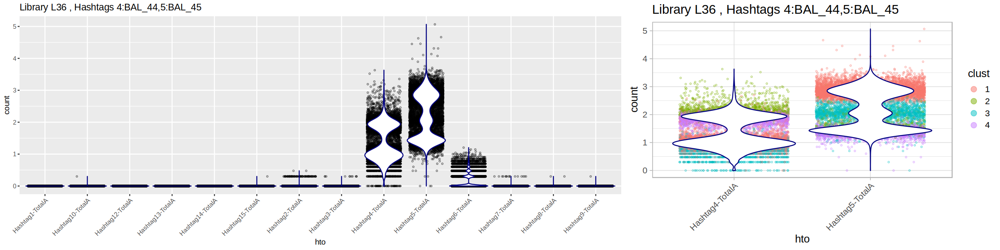

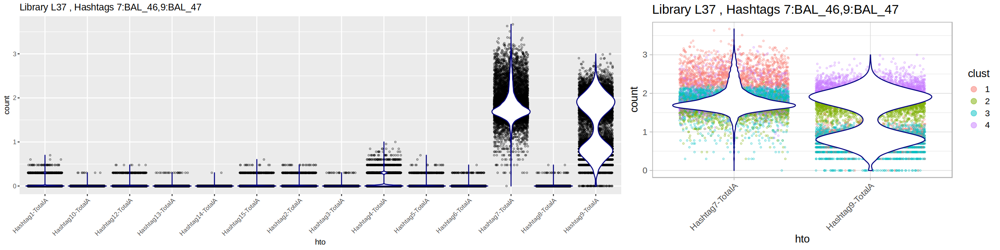

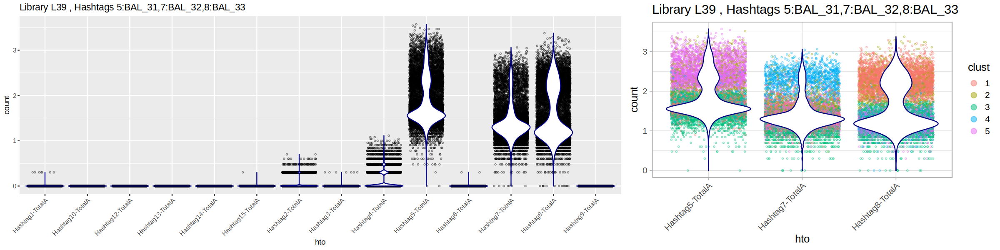

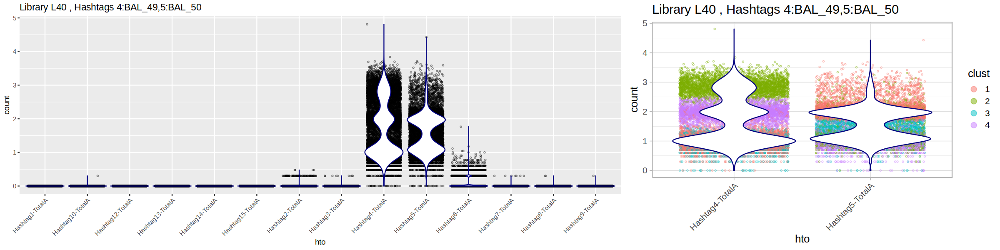

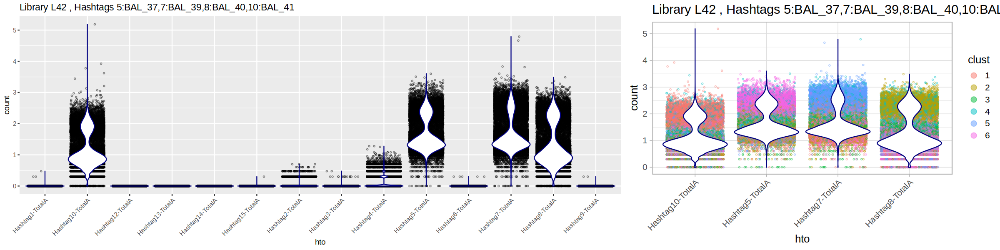

In [13]:
# De-multiplex samples from libraries
options(repr.plot.width=20, repr.plot.height=5)
set.seed(42)
ind <- data$libname[which(!is.na(data[["TotalSeq-A"]]))]
ds$hto_clust <- "None"
for (i in ind) {
    index <- data$sample[data$libname == i]
    index <- str_split(index, ",", simplify = TRUE)[1, ]
    
    index <- str_split(index, ":", simplify = TRUE)
    index <- as.data.frame(index)
    colnames(index) <- c("Hashtag", "Sample")
    index$Hashtag <- paste0("Hashtag", index$Hashtag, "-TotalA")
    
    # Sample overview
    cells <- colnames(ds)[ds$libname == i]
    df <- as.data.frame(t(as.matrix(ds[["HTO"]]@counts[, cells])))
    df <- log10(df+1)
    df <- tidyr::gather(df, "hto", "count")
    
    p <- ggplot(df, aes(hto, count)) +
      geom_point(position = "jitter", size=.5, shape = 21, alpha = .5) +
      geom_violin(scale = "width", col = "navy") +
      labs(title = paste0("Library ", i, " , Hashtags ", data$sample[data$libname == i])) +
      theme(
        axis.text.x = element_text(angle = 45, hjust=1, vjust=1)
      )

    # Barcode clusters
    df <- as.data.frame(t(as.matrix(ds[["HTO"]]@counts[index$Hashtag, cells])))
    df <- as.data.frame(log10(df+1))
    df$clust <- factor(kmeans(df, nrow(index)+2)$cluster)
    ds$hto_clust[ds$libname == i] <- paste0(i, ":", as.character(df$clust))
    df$bc <- row.names(df)
    df <- tidyr::gather(df, "hto", "count", -clust, -bc)
    
    p2 <- ggplot(df, aes(hto, count, col = clust)) +
      geom_point(position = "jitter", size=.5, shape = 21, alpha = .5) +
      geom_violin(scale = "width", col = "navy") +
      labs(title = paste0("Library ", i, " , Hashtags ", data$sample[data$libname == i])) +
      theme_light(15) +
      theme(
        axis.text.x = element_text(angle = 45, hjust=1, vjust=1)
      ) +
      ggplot2::guides(
        color = guide_legend(override.aes = list(size=5, shape=20))
      )

    print(plot_grid(p, p2, rel_widths = c(1.5, 0.9)))
}

`summarise()` has grouped output by 'libname', 'hto'. You can override using
the `.groups` argument.
Warning message in eval(expr, envir, enclos):
“Clusters L39:2L42:4 are duplicated”


[1] "Unassigned cluster: L37:3" "Unassigned cluster: L39:3"
[3] "Unassigned cluster: L40:3" "Unassigned cluster: L42:3"


[1] "BAL_1"     "BAL_2"     "BAL_3"     "BAL_4"     "BAL_5"     "BAL_6"    
 [7] "BAL_7"     "BAL_8"     "BAL_9"     "BAL_13"    "BAL_14"    "BAL_15"   
[13] "BAL_16"    "BAL_17"    "BAL_19"    "BAL_20"    "BAL_21"    "BAL_22"   
[19] "BAL_23"    "BAL_24"    "BAL_25"    "BAL_26"    "BAL_27"    "BAL_28"   
[25] "BAL_31"    "BAL_32"    "BAL_33"    "BAL_34"    "BAL_35"    "BAL_36"   
[31] "BAL_42"    "BAL_43"    "BAL_44"    "BAL_45"    "Undefined" "BAL_47"   
[37] "BAL_46"    "BAL_48"    "Doublet"   "BAL_49"    "BAL_50"    "BAL_51"   
[43] "BAL_41"    "BAL_39"    "BAL_37"    "BAL_40"    "BAL_52"    "BAL_53"

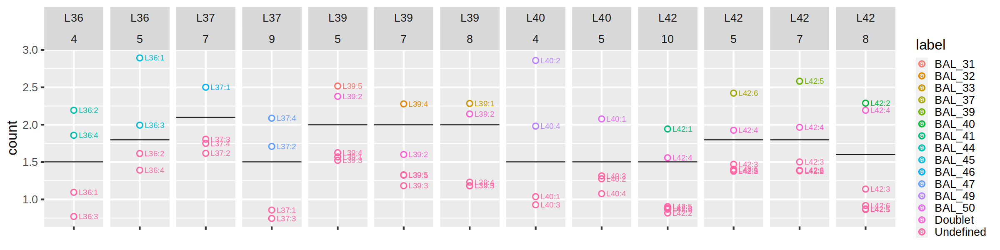

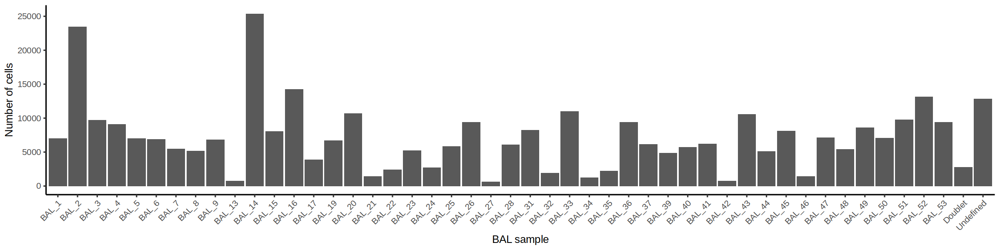

In [14]:
# Select clusters for hashtags using thresholds
hto_thresh <- c(
    "L36:4" = 1.5,
    "L36:5" = 1.8,
    "L37:7" = 2.1,
    "L37:9" = 1.5,
    "L39:5" = 2,
    "L39:7" = 2,
    "L39:8" = 2,
    "L40:4" = 1.5,
    "L40:5" = 1.5,
    "L42:5" = 1.8,
    "L42:7" = 1.8,
    "L42:8" = 1.6,
    "L42:10" = 1.5
)

# Fetch expression data
dat <- as.data.frame(Matrix::t(ds[["HTO"]]@counts))
dat$libname <- ds$libname
dat$clust <- ds$hto_clust
dat <- gather(dat, "hto", "count", -libname, -clust)
dat$count <- log10(dat$count + 1)

# Summarize
dat <- summarize(group_by(dat, libname, hto, clust), count = mean(count))
dat$ht <- str_split(dat$hto, "-", simplify=TRUE)[,1]
dat$ht <- str_remove(dat$ht, "Hashtag")
dat$id <- paste(dat$libname, dat$ht, sep = ":")

# Subset
dat <- dat[dat$libname %in% ind, ]
dat <- dat[dat$count > 0.5, ]
dat <- dat[dat$id %in% names(hto_thresh), ]

# Add thresholds
dat$thresh <- hto_thresh[dat$id]

# Add assignment
dat$assign <- "Undefined"
index <- which(dat$count >= dat$thresh)
dat$assign[index] <- dat$id[index]

# Assign doublet clusters
sub <- dat[dat$count >= dat$thresh, ]
if (any(duplicated(sub$clust))) {
    x <- unique(sub$clust[duplicated(sub$clust)])
    warning("Clusters ", x, " are duplicated")
    index <- which(dat$clust %in% x)
}
dat$assign[index] <- "Doublet"

# Assign hto cluster to cells
sub <- dat[dat$count >= dat$thresh, ]
sub <- unique(sub[, c("clust", "assign")])
c2l <- sub$assign
names(c2l) <- sub$clust
c2l <- c(c2l, c("None"="None"))
ds$hto_assign <- c2l[ds$hto_clust]

# Assign unassigned clusters
index <- which(is.na(ds$hto_assign))
print(paste("Unassigned cluster:", unique(ds$hto_clust[index])))
ds$hto_assign[index] <- "Undefined"

# Convert combination of libname:hashtag to sample
x <- overview$libraries[overview$libraries$libname %in% ind, c("libname", "sample")]
c2l <- c("None"="None", "Undefined"="Undefined", "Doublet"="Doublet")
for (i in x$libname) {
    index <- which(x$libname == i)
    y <- unlist(str_split(x$sample[index], ","))
    z <- str_split(y, ":", simplify=TRUE)
    y <- z[,2]
    names(y) <- paste(rep(i, length(y)), z[,1], sep=":")
    c2l <- c(c2l, y)
}

# Assign cells to sample
dat$label <- c2l[dat$assign]
ds$hto_assign <- c2l[ds$hto_assign]
index <- which(ds$libname %in% ind)
ds$sample[index] <- ds$hto_assign[index]
unique(ds$sample)

# Plot
options(repr.plot.width=20, repr.plot.height=5)
ggplot(dat, aes("", count, col=label, label=clust)) +
geom_point(shape=21, size=3, stroke=1) +
geom_text(nudge_x = .3) +
geom_hline(aes(yintercept = thresh)) +
facet_wrap(libname~ht, nrow=1) +
theme_grey(20) +
guides(color = guide_legend(ncol = 1)) +
labs(x = NULL)

# Plot
df <- as.data.frame(table(ds$sample))
df$num <- as.numeric(str_split(df$Var1, "_", simplify = TRUE)[,2])
df <- df[order(df$num), ]
df$Var1 <- factor(df$Var1, unique(df$Var1))
ggplot(df, aes(Var1, Freq)) + geom_col() + theme_classic(15) + theme(axis.text.x = element_text(angle=45, hjust=1, vjust=1)) +
labs(x = "BAL sample", y = "Number of cells")

In [15]:
# Add meta data
ds$lib_sample <- paste(ds$libname, ds$sample, sep = ":")
meta_data$lib_sample <- paste(meta_data$libname, meta_data$sample, sep = ":")
index <- match(ds$lib_sample, meta_data$lib_sample)
ds@meta.data <- cbind(ds@meta.data, meta_data[index, ])

In [16]:
# Quality control - Metrics
ds <- add_qc_metrics(ds)

Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Removed 5476 rows containing non-finite values (`stat_bin2d()`).”
Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Removed 5476 rows containing non-finite values (`stat_bin2d()`).”


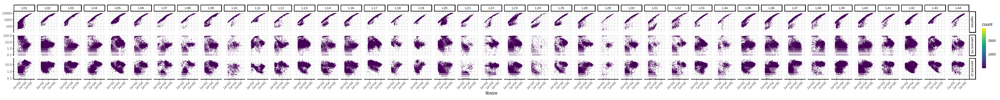

In [17]:
# Plot
options(repr.plot.width=50, repr.plot.height=5)
plot_qc_metrics(ds, split_by = "libname", split_by_max = 50)
fn <- paste0(plot_dir, "qc_lib", ".", "png")
ggsave(fn, width = 50, height = 5, bg="white", limitsize = FALSE)

Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 17123500)”
Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Removed 5476 rows containing non-finite values (`stat_bin2d()`).”


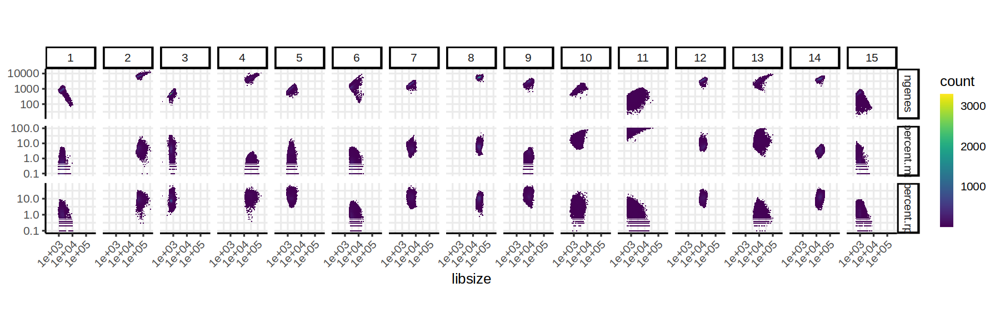

In [18]:
# Quality control - Clusters
set.seed(42)
df <- ds@meta.data[, c("libsize", "ngenes", "percent.mt", "percent.rp")]
df <- log1p(df)
ds$qc_cluster <- factor(kmeans(df, centers = 15)$cluster)

# Plot
options(repr.plot.width=15, repr.plot.height=5)
plot_qc_metrics(ds, split_by = "qc_cluster", split_by_max = 15)

Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Transformation introduced infinite values in continuous y-axis”


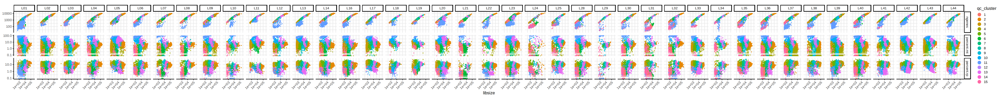

In [19]:
# Plot
options(repr.plot.width=50, repr.plot.height=5)
plot_qc_metrics(ds, split_by = "libname", color_by = "qc_cluster", split_by_max = 50)
fn <- paste0(plot_dir, "qc_lib-cluster", ".", "png")
ggsave(fn, width = 50, height = 5, bg="white", limitsize = FALSE)

,libsize,ngenes,percent.mt,percent.rp
,<dbl>,<dbl>,<dbl>,<dbl>
1,690.97,322.12,0.59,0.89
2,21244.38,2750.29,2.19,3.97
3,275.38,191.49,1.89,4.07


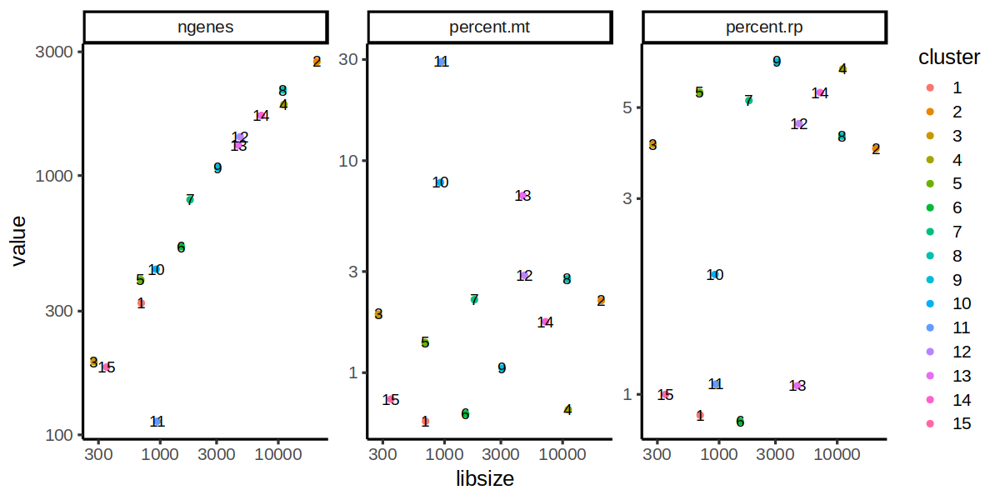

In [20]:
# Quality control - Classification
data <- as.data.frame(t(summarize_groups(t(as.matrix(exp(df-1))), ds$qc_cluster)))
data <- round(data, 2)
ds$quality <- "Good"
ds$quality[ds$qc_cluster %in% rownames(data)[which(data$percent.mt > 5)]] <- "Bad"
ds$quality <- factor(ds$quality)

# Plot
options(repr.plot.width=10, repr.plot.height=5)
head(data, 3)
data$cluster <- row.names(data)
data$cluster <- factor(data$cluster, sort(unique(as.numeric(data$cluster))))
data <- tidyr::gather(data, "metric", "value", -libsize, -cluster)
ggplot(data, aes(libsize, value, label = cluster, col = cluster)) +
geom_point() +
geom_text(col = "black") +
facet_wrap(~metric, scales = "free_y") +
theme_classic(15) +
scale_x_continuous(trans = "log10") +
scale_y_continuous(trans = "log10")

Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Removed 5476 rows containing non-finite values (`stat_bin2d()`).”
Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Removed 5476 rows containing non-finite values (`stat_bin2d()`).”


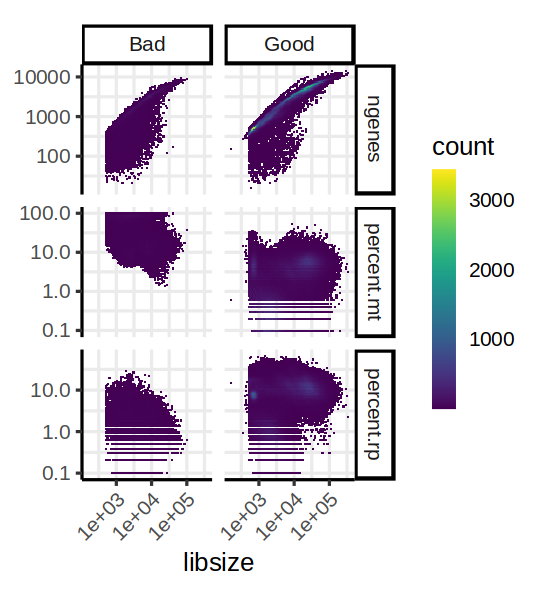

In [21]:
# Plot
options(repr.plot.width=4.5, repr.plot.height=5)
plot_qc_metrics(ds, split_by = "quality")
fn <- paste0(plot_dir, "qc_quality", ".", "png")
ggsave(fn, width = 6, height = 6, bg="white", limitsize = FALSE)

In [22]:
# Quality control - Filter
cells <- colnames(ds)[which(!ds$quality == "Bad")]
paste("Removing", (1-round(length(cells) / ncol(ds), 4))*100, "% of cells")
ds <- subset(ds, cells = cells)

[1] "Removing 8.50999999999999 % of cells"

Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Removed 5429 rows containing non-finite values (`stat_bin2d()`).”
Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Removed 5429 rows containing non-finite values (`stat_bin2d()`).”


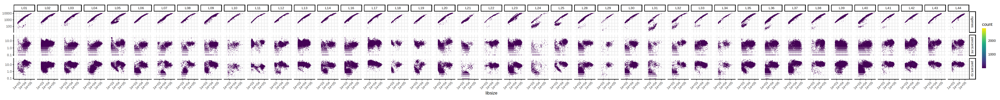

In [23]:
# Plot
options(repr.plot.width=50, repr.plot.height=5)
plot_qc_metrics(ds, split_by = "libname", split_by_max = 50)
fn <- paste0(plot_dir, "qc_lib-filtered", ".", "png")
ggsave(fn, width = 50, height = 5, bg="white", limitsize = FALSE)

In [24]:
unique(ds$lib_sample)

[1] "L01:BAL_1"     "L02:BAL_2"     "L03:BAL_3"     "L04:BAL_4"    
 [5] "L05:BAL_5"     "L06:BAL_6"     "L07:BAL_7"     "L08:BAL_8"    
 [9] "L09:BAL_9"     "L10:BAL_13"    "L11:BAL_14"    "L12:BAL_15"   
[13] "L13:BAL_16"    "L14:BAL_17"    "L16:BAL_19"    "L17:BAL_20"   
[17] "L18:BAL_21"    "L19:BAL_22"    "L20:BAL_23"    "L21:BAL_24"   
[21] "L22:BAL_25"    "L23:BAL_26"    "L24:BAL_27"    "L25:BAL_28"   
[25] "L28:BAL_31"    "L29:BAL_32"    "L30:BAL_33"    "L31:BAL_34"   
[29] "L32:BAL_35"    "L33:BAL_36"    "L34:BAL_42"    "L35:BAL_43"   
[33] "L36:BAL_44"    "L36:BAL_45"    "L37:Undefined" "L37:BAL_47"   
[37] "L37:BAL_46"    "L38:BAL_48"    "L39:BAL_33"    "L39:BAL_31"   
[41] "L39:Doublet"   "L39:BAL_32"    "L39:Undefined" "L40:BAL_49"   
[45] "L40:BAL_50"    "L40:Undefined" "L41:BAL_51"    "L42:BAL_41"   
[49] "L42:BAL_39"    "L42:BAL_37"    "L42:BAL_40"    "L42:Doublet"  
[53] "L42:Undefined" "L43:BAL_52"    "L44:BAL_53"

In [25]:
# Transform data
ds <- NormalizeData(ds)
ds <- FindVariableFeatures(ds)
ds <- ScaleData(ds)
ds <- RunPCA(ds)

Centering and scaling data matrix

PC_ 1 
Positive:  S100A9, APOE, FN1, FABP4, CCL18, LSAMP, INHBA, CTSL, SCD, MME 
	   RETN, S100A8, AC092691.1, FABP3, SPRED1, HMOX1, APOC2, CES1, TPRG1, MIR3945HG 
	   RBP4, TRHDE, TGM2, IL1RN, FMN1, ANO5, IFIT2, IL1R2, VCAN, RTN1 
Negative:  SKAP1, SYNE2, CD96, CD2, IL32, BCL11B, THEMIS, FYN, ETS1, SLFN12L 
	   IKZF3, CD247, FUT8, CCL5, INPP4B, CARD11, TRAC, SLC38A1, ITK, GZMA 
	   TC2N, PPP1R16B, CAMK4, C12orf75, PRKCQ, TRBC2, KLF12, RORA, TSPAN5, SYTL2 
PC_ 2 
Positive:  CD2, SKAP1, IL32, CD96, THEMIS, BCL11B, CCL5, GZMA, TRAC, CD247 
	   SLFN12L, FYN, ETS1, IKZF3, TRBC2, ITK, PRKCQ, CAMK4, CARD11, PPP1R16B 
	   GRAP2, PYHIN1, SAMD3, RUNX3, CORO1A, ADAM19, LINC01934, FUT8, SLC38A1, LINC01871 
Negative:  WFDC2, KRT8, ELF3, KRT19, TMC5, FXYD3, TSPAN1, PARD3, KRT18, CHST9 
	   EPCAM, ENAH, MUC4, MAPK10, MYH14, MUC16, FOXP2, TEAD1, SLC44A4, NEBL 
	   DSP, MECOM, AGR2, TACC2, AGR3, SDK1, TRIM2, TACSTD2, NFIB, CLDN4 
PC_ 3 
Positive:  MKI67, STMN1, TOP2A

In [ ]:
# Integrate data
ds$batch <- paste(ds$libname, ds$sample, sep=":")
ds <- RunMNN(ds, batch = "batch")

In [ ]:
# Calculate embedding & clusters
dims <- c(10, 20, 30, 40)
red <- c("pca", "mnn")
dr <- unlist(lapply(red, paste, dims, sep="_"))
for (i in dr) {
    print(paste("Computing embedding and clusters for", i))
    d = str_split(i, "_")[[1]][[2]]
    r = str_split(i, "_")[[1]][[1]]
    umap_key <- paste0(r, "_", d, "_umap")
    graph_key <- paste0(r, "_", d, "_graph")
    clust_key <- paste0(r, "_", d, "_cluster")
    if (umap_key %in% names(ds@reductions)) {
        print(paste("Reduction", umap_key, "has already been computed."))
} else if (!r %in% names(ds@reductions)) {
        print(paste0("Reduction '", r, "' not present. Aborting."))
    } else {
        print(paste("Running algorithms for reduction", r, "for", d, "components."))
        ds <- RunUMAP(ds, dims=1:d, reduction = r, reduction.key = umap_key, reduction.name = umap_key,
                      return.model = TRUE, verbose = FALSE)
        ds <- FindNeighbors(ds, dims=1:d, reduction = r, graph.name = graph_key)
        ds <- FindClusters(ds, algorithm = 3, graph.name = graph_key, resolution = 2)
        ds[[clust_key]] <- ds$seurat_clusters
    }
}

[1] "pca"         "mnn"         "pca_10_umap" "pca_20_umap" "pca_30_umap"
 [6] "pca_40_umap" "mnn_10_umap" "mnn_20_umap" "mnn_30_umap" "mnn_40_umap"

Warning message in plot_embedding(ds, embedding = emb):
“Expression/metadata for '' not found.”


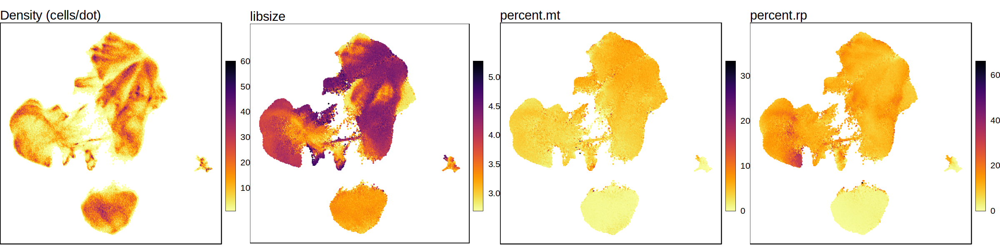

In [8]:
# Plot
options(repr.plot.width=20, repr.plot.height=5)
names(ds@reductions)
emb <- "mnn_30_umap"
cowplot::plot_grid(
    plot_embedding(ds, embedding=emb),
    plot_embedding(ds, "libsize", embedding=emb, color.transform="log10"),
    plot_embedding(ds, "percent.mt", embedding=emb),
    plot_embedding(ds, "percent.rp", embedding=emb), nrow = 1
)

In [ ]:
# Save data
print(paste("Saving data to", out_file))
saveRDS(ds, out_file)

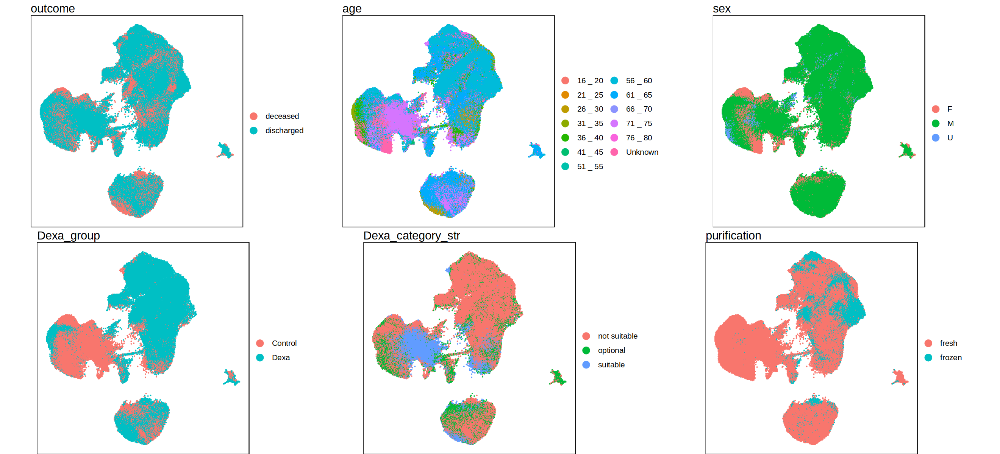

In [69]:
# Plot
options(repr.plot.width=22, repr.plot.height=10)
cowplot::plot_grid(
    plot_embedding(ds, "outcome", embedding=emb),
    plot_embedding(ds, "age", embedding=emb),
    plot_embedding(ds, "sex", embedding=emb), 
    plot_embedding(ds, "Dexa_group", embedding=emb), 
    plot_embedding(ds, "Dexa_category_str", embedding=emb), 
    plot_embedding(ds, "purification", embedding=emb), 
    nrow = 2
)

Warning message in plot_embedding(ds, split.by = "outcome", embedding = emb):
“Expression/metadata for '' not found.”


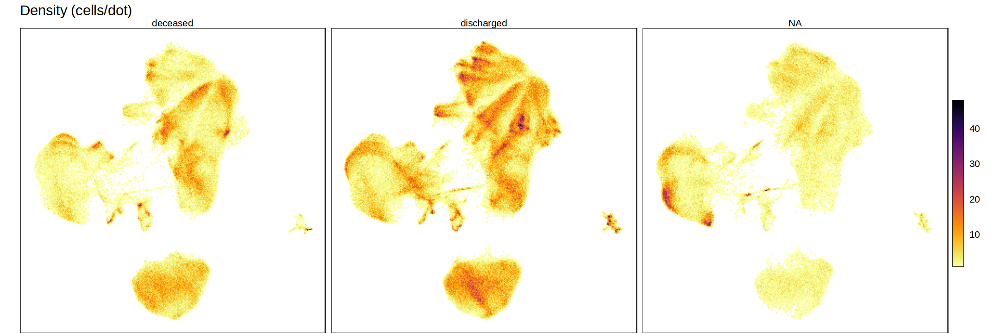

In [70]:
# Plot
options(repr.plot.width=18, repr.plot.height=6)
plot_embedding(ds, split.by = "outcome", embedding=emb)

Warning message in plot_embedding(ds, split.by = "age", embedding = emb, split.by.rows = 2):
“Expression/metadata for '' not found.”


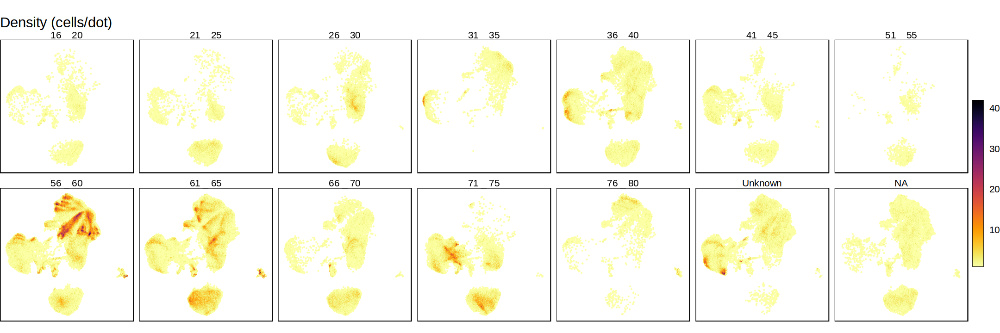

In [71]:
# Plot
options(repr.plot.width=18, repr.plot.height=6)
plot_embedding(ds, split.by = "age", embedding=emb, split.by.rows = 2)

Warning message in plot_embedding(ds, split.by = "sex", embedding = emb):
“Expression/metadata for '' not found.”


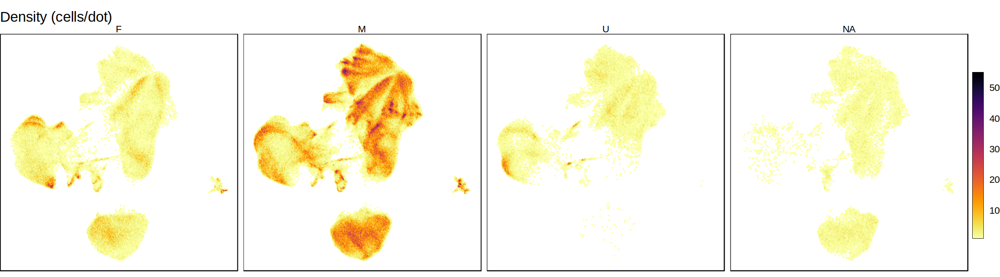

In [72]:
# Plot
options(repr.plot.width=18, repr.plot.height=5)
plot_embedding(ds, split.by = "sex", embedding=emb)

Warning message in plot_embedding(ds, split.by = "Dexa_group", embedding = emb):
“Expression/metadata for '' not found.”


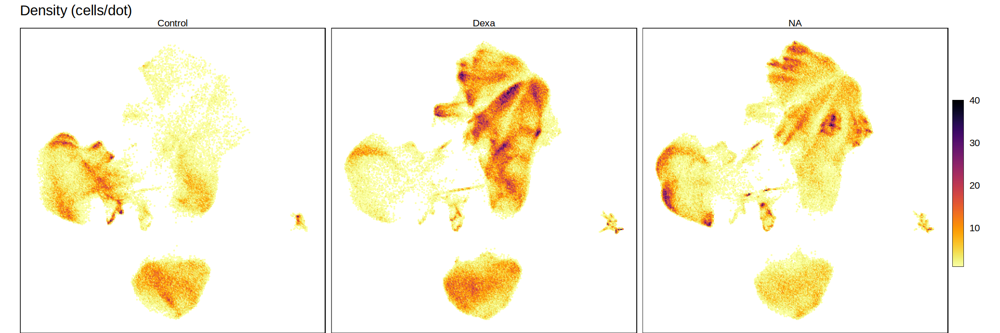

In [73]:
# Plot
options(repr.plot.width=18, repr.plot.height=6)
plot_embedding(ds, split.by = "Dexa_group", embedding=emb)

Warning message in plot_embedding(ds, split.by = "Dexa_category_str", embedding = emb):
“Expression/metadata for '' not found.”


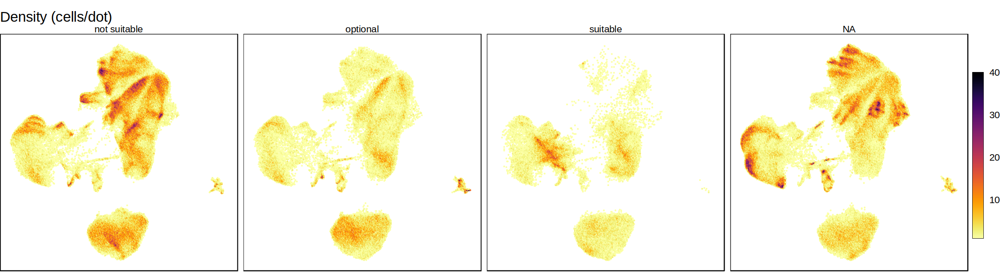

In [74]:
# Plot
options(repr.plot.width=18, repr.plot.height=5)
plot_embedding(ds, split.by = "Dexa_category_str", embedding=emb)

Warning message in plot_embedding(ds, split.by = "purification", embedding = emb):
“Expression/metadata for '' not found.”


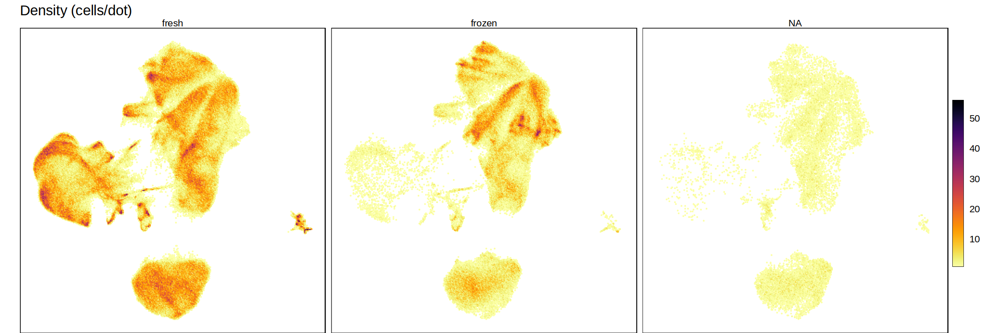

In [75]:
# Plot
options(repr.plot.width=18, repr.plot.height=6)
plot_embedding(ds, split.by = "purification", embedding=emb)

In [76]:
# Transfer cohort A annotations
dat <- read.csv(in_meta_promac)

# Cell type
ds$ann_cohort_A <- "None"
ds$ann_cohort_A[ds$cohort == "A"] <- "Low quality"
index <- colnames(ds) %in% rownames(dat)
ds$ann_cohort_A[index] <- dat$Celltype[match(colnames(ds)[index], rownames(dat))]

# Macrophage cluster
ds$mac_cohort_A <- "None"
ds$mac_cohort_A[ds$cohort == "A"] <- "Low quality"
index <- colnames(ds) %in% rownames(dat)
ds$mac_cohort_A[index] <- dat$mac_type[match(colnames(ds)[index], rownames(dat))]

Warning message in plot_embedding(ds, embedding = emb, theme.size = 20):
“Expression/metadata for '' not found.”


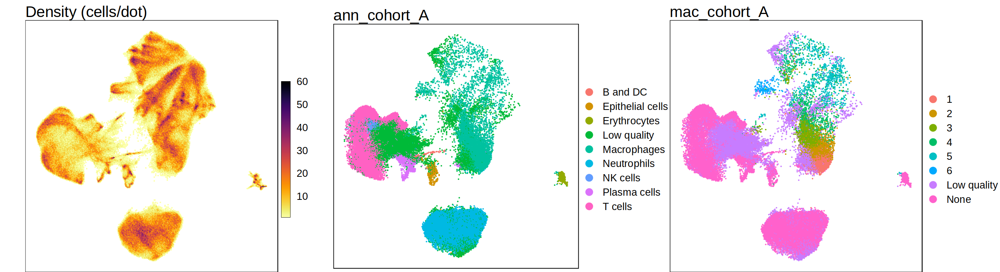

In [77]:
# Plot
options(repr.plot.width=22, repr.plot.height=6)
cells <- colnames(ds)[ds$ann_cohort_A != "None"]
pl <- list(
    plot_embedding(ds, embedding=emb, theme.size=20),
    plot_embedding(ds, "ann_cohort_A", embedding = emb, theme.size = 20, cells=cells),
    plot_embedding(ds, "mac_cohort_A", embedding = emb, theme.size = 20, cells=cells)
)
plot_grid(plotlist = pl, nrow = 1)

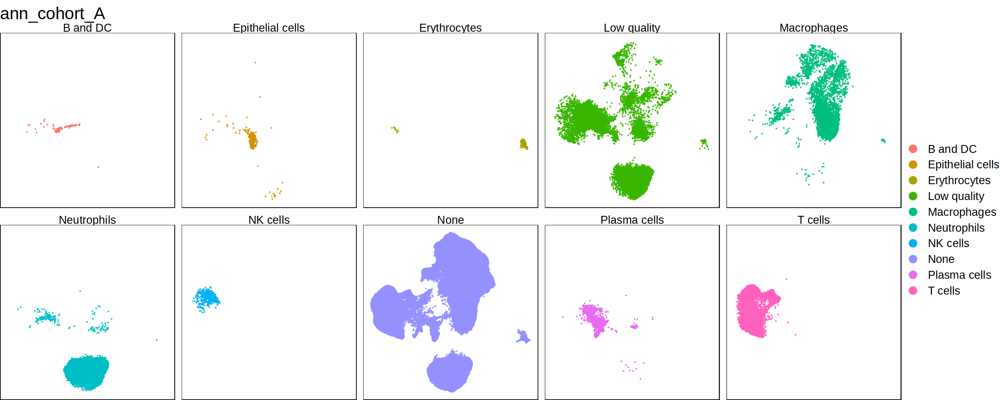

In [78]:
# Plot
options(repr.plot.width=20, repr.plot.height=8)
plot_embedding(ds, "ann_cohort_A", split.by = "ann_cohort_A", embedding = emb, split.by.rows = 2, theme.size = 20)

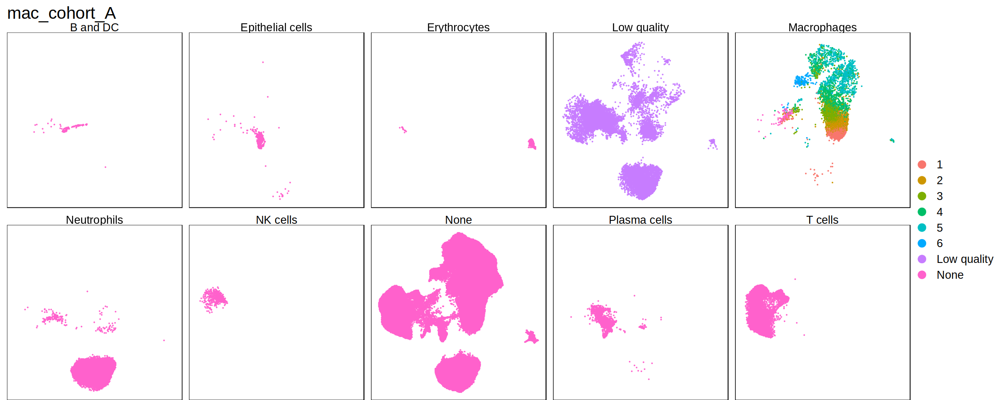

In [79]:
# Plot
options(repr.plot.width=20, repr.plot.height=8)
plot_embedding(ds, "mac_cohort_A", split.by = "ann_cohort_A", embedding = emb, split.by.rows = 2, theme.size = 20)

In [80]:
# Annotation - Cell type AUC
dict <- markers$celltype
gsets <- split(dict$gene, dict$type)
ds <- AddAUC(ds, gsets, "celltype.auc")

ERROR: Error in AddAUC(ds, gsets, "celltype.auc"): Assay celltype.auc  already exists. 
               To replace set force.recalc = TRUE


Warning message in plot_markers_embedding(ds, assay = "celltype.auc", scale = FALSE, :
“No markers specified. Defaulting to whole assay.”


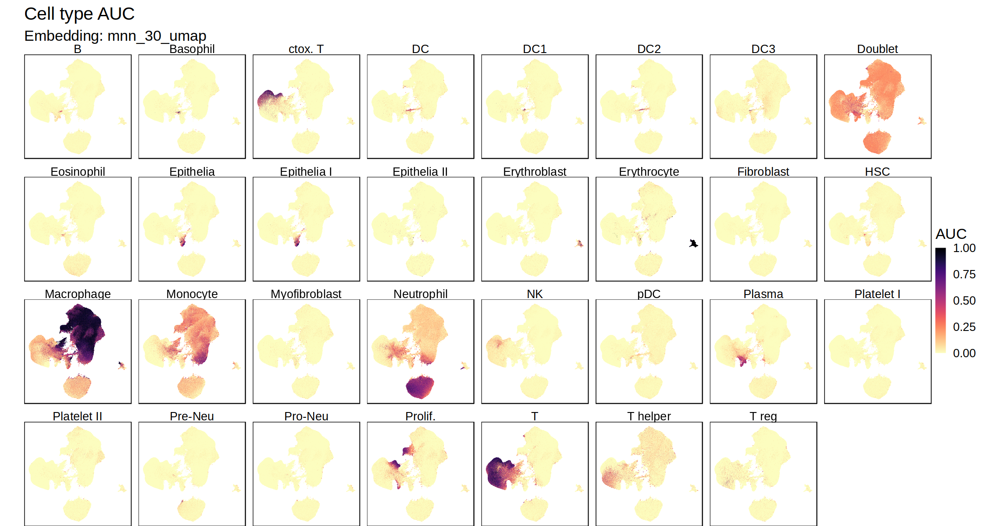

In [81]:
# Plot
options(repr.plot.width=19, repr.plot.height=10)
plot_markers_embedding(ds, assay = "celltype.auc", scale = FALSE, pt.size = .1, pt.stroke = .1, nrow = 4,
                       pl.title = "Cell type AUC", col.title = "AUC", embedding = emb)
fn <- paste0(plot_dir, "pca-umap_celltype-markers-AUC", ".", "png")
ggsave(fn, width = 20, height = 10, bg="white", limitsize = FALSE)

In [82]:
# Plot
p <- plot_markers_embedding(ds, unlist(gsets))
fn <- paste0(plot_dir, "pca-umap_celltype-markers", ".", "png")
ggsave(fn, p, width = 20, height = 20, bg="white", limitsize = FALSE)

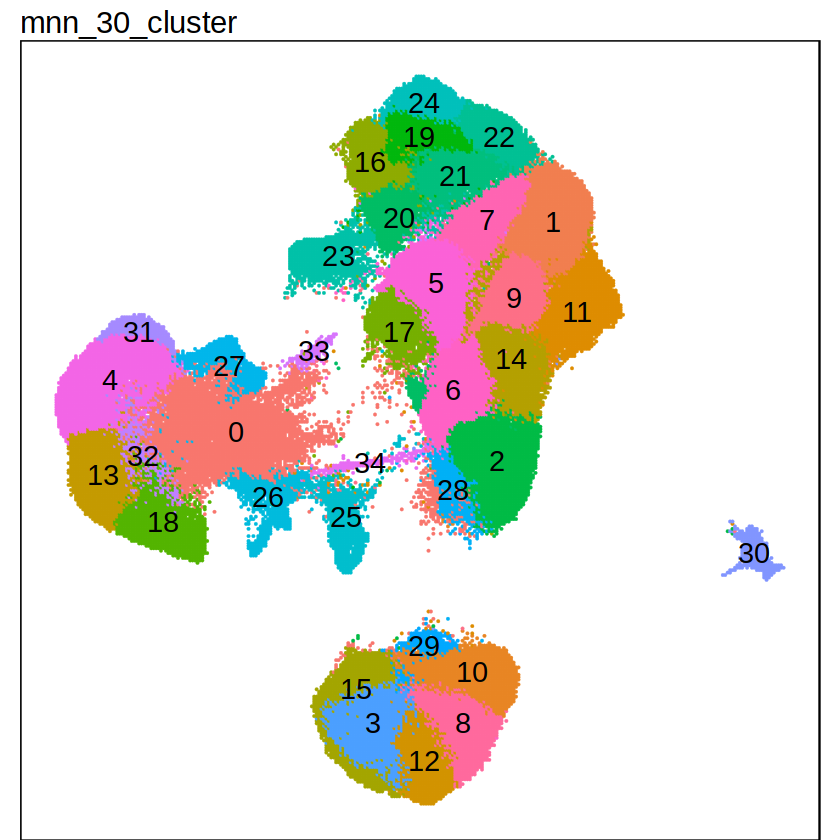

In [120]:
# Plot
options(repr.plot.width=7, repr.plot.height=7)
clust <- str_replace(emb, "umap", "cluster")
plot_embedding(ds, clust, label = "text", embedding = emb)

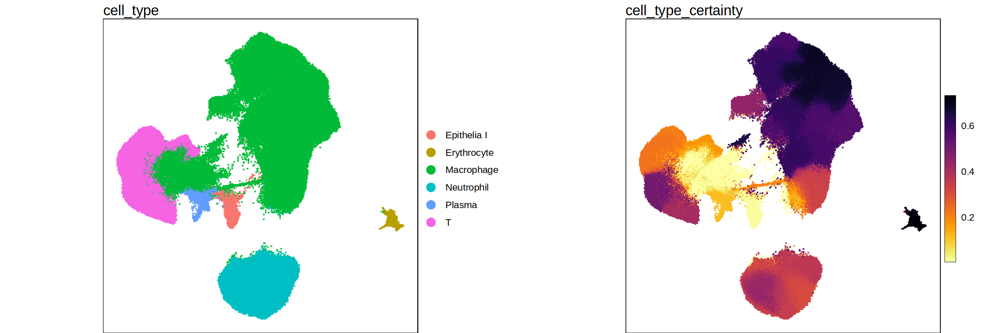

In [121]:
# Annotate
ds <- SeuratHelper::annotate_maxAUC(ds, assay = "celltype.auc", group.by = clust)

# Plot
options(repr.plot.width=18, repr.plot.height=6)
cowplot::plot_grid(
    plot_embedding(ds, "cell_type", legend.cols = 1, embedding=emb),
    plot_embedding(ds, "cell_type_certainty", embedding=emb), 
    rel_widths = c(1.5, 1)
    )

Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Removed 5429 rows containing non-finite values (`stat_bin2d()`).”


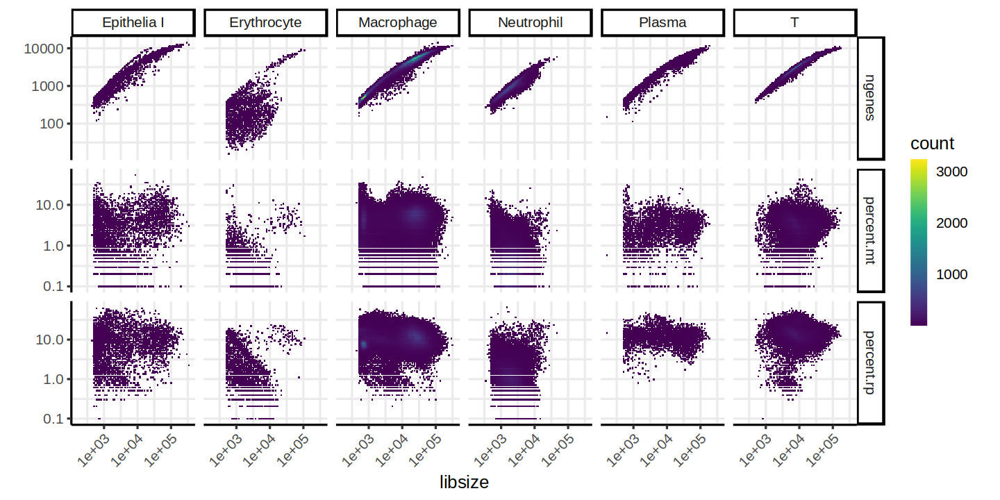

In [122]:
# Cell type QC
options(repr.plot.width=12, repr.plot.height=6)
plot_qc_metrics(ds, split_by = "cell_type", split_by_max = 20)

Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Transformation introduced infinite values in continuous y-axis”


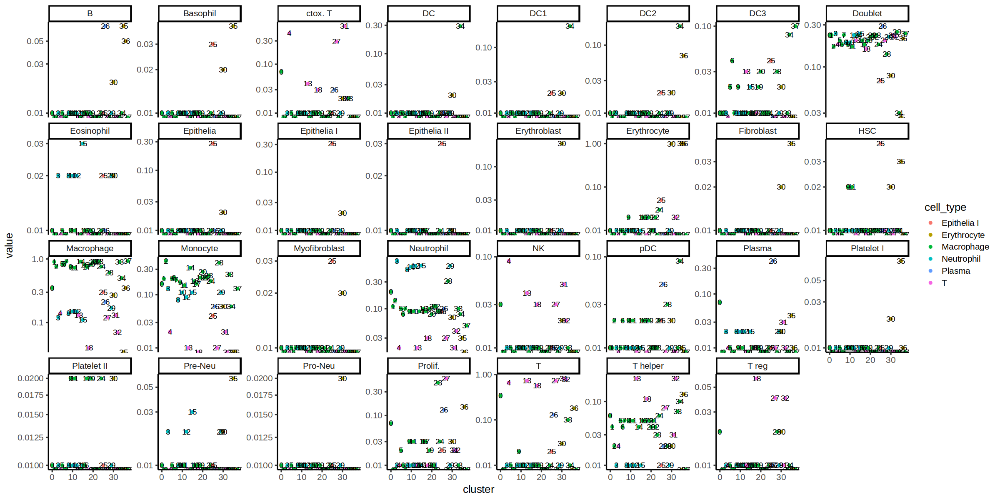

In [123]:
# Refine annotation
df <- as.data.frame(t(ds[["celltype.auc"]]@data))
df <- t(summarize_groups(t(as.matrix(df)), ds@meta.data[[clust]]))
df <- as.data.frame(round(df, 2))
df$cluster <- rownames(df)
data <- unique(ds@meta.data[, c("cell_type", clust)])
ind <- match(df$cluster, data[[clust]])
df$cell_type <- data[["cell_type"]][ind]
df$cluster <- as.numeric(df$cluster)
data <- tidyr::gather(df, "metric", "value", -cluster, -cell_type)

# Plot
options(repr.plot.width=20, repr.plot.height=10)
ggplot(data, aes(cluster, value, label = cluster, col = cell_type)) +
geom_point() +
geom_text(col = "black") +
facet_wrap(~metric, scales = "free_y", nrow = 4) +
theme_classic(15) +
scale_y_continuous(trans = "log10")

In [133]:
# Refine annotation
df$cell_type <- as.character(df$cell_type)
ds$celltype <- as.character(ds$cell_type)

# Low quality cells
index <- list(
    rownames(df)[which(df$cell_type == "Macrophage" & df[["T"]] > 0.10)],
    rownames(df)[which(df$cell_type == "Plasma" & df[["T"]] > 0.10)],
    rownames(df)[which(df$cell_type == "T" & df[["Macrophage"]] > 0.30)]
)
index <- unlist(index)
ds$celltype[ds@meta.data[[clust]] %in% index] <- "Low quality"

# Monocytes
index <- rownames(df)[which(df$cell_type == "Macrophage" & df[["Monocyte"]] > 0.32)]
ds$celltype[ds@meta.data[[clust]] %in% index] <- "Monocyte"

# Epithelia
index <- rownames(df)[which(df[["Epithelia"]] > 0.12)]
ds$celltype[ds@meta.data[[clust]] %in% index] <- "Epithelia"

# DC
index <- rownames(df)[which(df[["DC"]] > 0.10)]
ds$celltype[ds@meta.data[[clust]] %in% index] <- "DC"

# Fibroblast
index <- rownames(df)[which(df[["Fibroblast"]] > 0.025)]
ds$celltype[ds@meta.data[[clust]] %in% index] <- "Fibroblast"

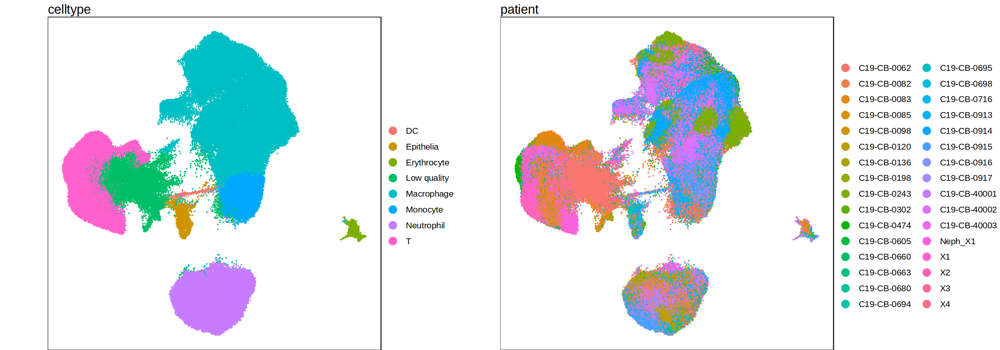

In [134]:
# Plot
ds$patient <- factor(ds$patient)
options(repr.plot.width=20, repr.plot.height=7)
cowplot::plot_grid(
    plot_embedding(ds, "celltype", legend.cols = 1, embedding=emb),
    plot_embedding(ds, "patient", legend.cols = 2, embedding=emb)
    )

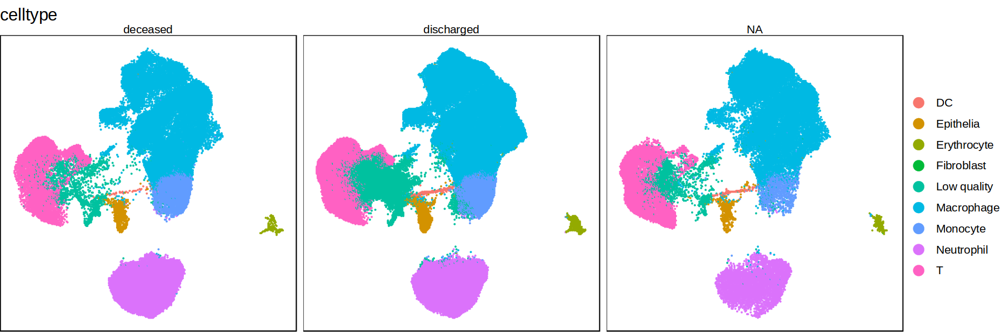

In [135]:
# Plot
options(repr.plot.width=15, repr.plot.height=5)
plot_embedding(ds, "celltype", legend.cols = 1, split.by = "outcome", embedding=emb)
fn <- paste0(plot_dir, emb, "_", "celltype-outcome", ".", "png")
ggsave(fn, width = 15, height = 5, bg="white", limitsize = FALSE)

In [ ]:
# Temporary !!!
ds <- readRDS(out_file)

In [28]:
# Replace meta data
meta_data$lib_sample <- paste(meta_data$libname, meta_data$sample, sep = ":")
index <- match(ds$lib_sample, meta_data$lib_sample)
for (i in names(meta_data)) {
    ds@meta.data[[i]] <- meta_data[[i]][index]
}

In [31]:
# Save data
saveRDS(ds, out_file)

In [32]:
sessionInfo()

R version 4.3.1 (2023-06-16)
Platform: x86_64-conda-linux-gnu (64-bit)
Running under: AlmaLinux 8.5 (Arctic Sphynx)

Matrix products: default
BLAS/LAPACK: /home/odietric/miniconda3/envs/covid19-bal-atlas/lib/libopenblasp-r0.3.24.so;  LAPACK version 3.11.0

locale:
 [1] LC_CTYPE=en_US.UTF-8       LC_NUMERIC=C              
 [3] LC_TIME=de_DE.UTF-8        LC_COLLATE=en_US.UTF-8    
 [5] LC_MONETARY=de_DE.UTF-8    LC_MESSAGES=en_US.UTF-8   
 [7] LC_PAPER=de_DE.UTF-8       LC_NAME=C                 
 [9] LC_ADDRESS=C               LC_TELEPHONE=C            
[11] LC_MEASUREMENT=de_DE.UTF-8 LC_IDENTIFICATION=C       

time zone: Europe/Berlin
tzcode source: system (glibc)

attached base packages:
[1] stats     graphics  grDevices utils     datasets  methods   base     

other attached packages:
[1] SeuratHelper_0.0.0.9000 cowplot_1.1.1           readxl_1.4.3           
[4] ggplot2_3.4.3           tidyr_1.3.0             stringr_1.5.0          
[7] dplyr_1.1.3             SeuratObject_4.1.4  